In [1]:
import dill
import os
work_dir = '/Scottbrowne/members/smd/Projects/SD031/scenicplus/B16_CART'
tmp_dir = '/scratch2/devoes/tmp'

infile = open(os.path.join(work_dir, 'scenicplus/scplus_obj_Results_hocomocov11.pkl'), 'rb')
scplus_obj = dill.load(infile)
infile.close()

/home/devoes/miniconda3/envs/SCENICplus_SCA/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/devoes/miniconda3/envs/SCENICplus_SCA/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/devoes/miniconda3/envs/SCENICplus_SCA/lib/pyth

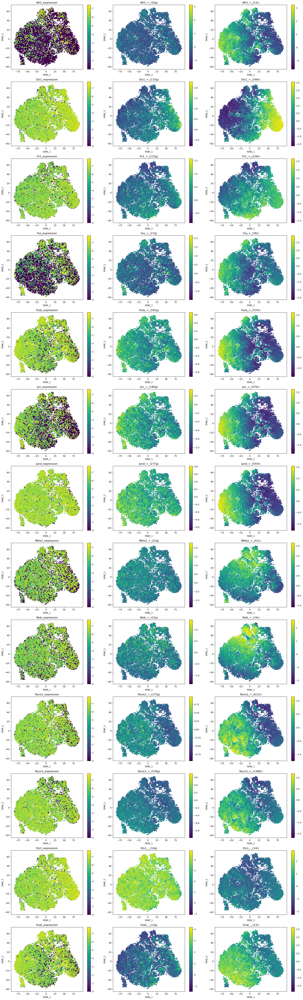

In [3]:
from scenicplus.dimensionality_reduction import plot_eRegulon

# "Plot TF expression and eRegulon AUC (gene and region based) into dimensionality reduction."

plot_eRegulon(
    scplus_obj = scplus_obj,
    reduction_name = 'eRegulons_tSNE_filtered',
    selected_regulons = [
         'Atf3_+',
'Ets1_+',
'Fli1_+',
'Fos_+',
'Fosb_+',
'Jun_+',
'Jund_+',
'Nfkb2_+',
'Relb_+',
'Runx2_+',
'Runx3_+',
#'Ets1_-',
#'Fosb_-'# sig mean L2FC diff motifs (2 sample)
         # nonsig, but bio-relevant
        ], 
    scale = True,
    auc_key = 'eRegulon_AUC_filtered')

In [ ]:
from scenicplus.dimensionality_reduction import plot_AUC_given_ax
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# "Plot eRegulon AUC values on dimmensionality reduction" 
# I'm fairly certain this plots singular ones instead of TF expr, gene AUC, Region AUC of the regulon

fig, ax = plt.subplots(figsize = (8,8))
plot_AUC_given_ax(
    scplus_obj = scplus_obj,
    reduction_name = 'eRegulons_tSNE_filtered',
    feature = 'Bach2_+_(66g)',
    ax = ax,
    auc_key = 'eRegulon_AUC_filtered', 
    signature_key = 'Gene_based')
sns.despine(ax = ax)
plt.show()

In [ ]:
from scenicplus.cistromes import TF_cistrome_correlation, generate_pseudobulks

generate_pseudobulks(
        scplus_obj = scplus_obj,
        variable = 'GEX_leiden',
        auc_key = 'eRegulon_AUC_filtered',
    nr_cells = 5, # default is 10. 5 in tutorial. should i move back up. smallest clutser is 378 - are we oversampling?
        signature_key = 'Gene_based')
generate_pseudobulks(
        scplus_obj = scplus_obj,
        variable = 'GEX_leiden',
        auc_key = 'eRegulon_AUC_filtered',
    nr_cells = 5,
        signature_key = 'Region_based')

TF_cistrome_correlation(
            scplus_obj,
            use_pseudobulk = True,
            variable = 'GEX_leiden',
            auc_key = 'eRegulon_AUC_filtered',
            signature_key = 'Gene_based',
            out_key = 'filtered_gene_based')
TF_cistrome_correlation(
            scplus_obj,
            use_pseudobulk = True,
            variable = 'GEX_leiden',
            auc_key = 'eRegulon_AUC_filtered',
            signature_key = 'Region_based',
            out_key = 'filtered_region_based')

In [ ]:
import numpy as np
n_targets = [int(x.split('(')[1].replace('r)', '')) for x in scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Cistrome']]
rho = scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Rho'].to_list()
adj_pval = scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Adjusted_p-value'].to_list()

thresholds = {
        'rho': [-0.1, 0.1], # I lowered stringency from 0.75 because our data has less variability than PBMC
        'n_targets': 0
}
import seaborn as sns
fig, ax = plt.subplots(figsize = (10, 5))
sc = ax.scatter(rho, n_targets, c = -np.log10(adj_pval), s = 5)
ax.set_xlabel('Correlation coefficient')
ax.set_ylabel('nr. target regions')
#ax.hlines(y = thresholds['n_targets'], xmin = min(rho), xmax = max(rho), color = 'black', ls = 'dashed', lw = 1)
ax.vlines(x = thresholds['rho'], ymin = 0, ymax = max(n_targets), color = 'black', ls = 'dashed', lw = 1)
ax.text(x = thresholds['rho'][0], y = max(n_targets), s = str(thresholds['rho'][0]))
ax.text(x = thresholds['rho'][1], y = max(n_targets), s = str(thresholds['rho'][1]))
sns.despine(ax = ax)
fig.colorbar(sc, label = '-log10(adjusted_pvalue)', ax = ax)
plt.show()

In [ ]:
selected_cistromes = scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based'].loc[
        np.logical_or(
                scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Rho'] > thresholds['rho'][1],
                scplus_obj.uns['TF_cistrome_correlation']['filtered_region_based']['Rho'] < thresholds['rho'][0]
        )]['Cistrome'].to_list()
selected_eRegulons = [x.split('_(')[0] for x in selected_cistromes]
selected_eRegulons_gene_sig = [
        x for x in scplus_obj.uns['eRegulon_signatures_filtered']['Gene_based'].keys()
        if x.split('_(')[0] in selected_eRegulons]
selected_eRegulons_region_sig = [
        x for x in scplus_obj.uns['eRegulon_signatures_filtered']['Region_based'].keys()
        if x.split('_(')[0] in selected_eRegulons]
#save the results in the scenicplus object
scplus_obj.uns['selected_eRegulon'] = {'Gene_based': selected_eRegulons_gene_sig, 'Region_based': selected_eRegulons_region_sig}
print(f'selected: {len(selected_eRegulons_gene_sig)} eRegulons')

In [ ]:
from scenicplus.plotting.dotplot import heatmap_dotplot
heatmap_dotplot(
        scplus_obj = scplus_obj,
        size_matrix = scplus_obj.uns['eRegulon_AUC_filtered']['Region_based'], #specify what to plot as dot sizes, target region enrichment in this case
        color_matrix = scplus_obj.to_df('EXP'), #specify  what to plot as colors, TF expression in this case
        scale_size_matrix = True,
        scale_color_matrix = True,
        group_variable = 'GEX_leiden',
        subset_eRegulons = scplus_obj.uns['selected_eRegulon']['Gene_based'],
        index_order = ['0', '1', '2', '3', '4', '5', '6', '7','8','9','11','12','13','14'], 
        figsize = (5, 20),
        orientation = 'vertical')

# Plot is color = TF expression, dot is region AUC

In [ ]:
from scenicplus.RSS import *

regulon_specificity_scores(
        scplus_obj,
        variable = 'GEX_leiden',
        auc_key = 'eRegulon_AUC_filtered',
        signature_keys = ['Region_based'],
        #selected_regulons = [x for x in scplus_obj.uns['selected_eRegulon']['Region_based'] if '-' not in x], 
    # should we include -?, if yes use commented line below
        selected_regulons = [x for x in scplus_obj.uns['selected_eRegulon']['Region_based']],
        out_key_suffix = '_filtered')

In [ ]:
plot_rss(scplus_obj, 'GEX_leiden_filtered', 
         num_columns=2, top_n=10, figsize = (25, 30))

In [ ]:
# write metadata to csv to view and filter in R
scplus_obj.uns['RSS']['GEX_clusters_filtered'].to_csv(os.path.join(work_dir,
                                                                   'scenicplus/regulon_filtered_selected_specificity_score_activators_hocomocov11.csv'), 
                                                      index=False)

In [ ]:
flat_list = lambda t: [item for sublist in t for item in sublist]
selected_markers = list(set(flat_list(
    [scplus_obj.uns['RSS']['GEX_leiden_filtered'].loc[celltype].sort_values(ascending = False).head(10).index.to_list() 
    for celltype in scplus_obj.uns['RSS']['GEX_clusters_filtered'].index]))) 

In [ ]:
from scenicplus.plotting.correlation_plot import *

region_intersetc_data, Z = jaccard_heatmap(
        scplus_obj,
        method = 'intersect',
        gene_or_region_based = 'Region_based',
        use_plotly = False,
        #selected_regulons = selected_markers, # THIS IS ONLY FOR SELECTED REGULONS, i chose to display all
        signature_key = 'eRegulon_signatures_filtered',
        figsize = (10, 10), return_data = True, vmax = 0.5, cmap = 'plasma')

In [ ]:
from pycisTopic.diff_features import find_highly_variable_features
# ID Top 1000 variable features to make sure eGRN visualization is computationally doable
# we will probably want to take top 5000-10000 and export to cytoscape given from scanpy pdcd1 and havcr2 were not in top 2000 and maybe 3000(?)
hvr = find_highly_variable_features(scplus_obj.to_df('ACC').loc[list(set(scplus_obj.uns['eRegulon_metadata_filtered']['Region']))], n_top_features=1000, plot = False) 
hvg = find_highly_variable_features(scplus_obj.to_df('EXP')[list(set(scplus_obj.uns['eRegulon_metadata_filtered']['Gene']))].T, n_top_features=1000, plot = False)

In [ ]:
from scenicplus.networks import create_nx_tables, create_nx_graph, plot_networkx, export_to_cytoscape
nx_tables = create_nx_tables(
    scplus_obj = scplus_obj,
    eRegulon_metadata_key ='eRegulon_metadata_filtered', 
    subset_eRegulons = [
        'Bach2',
        'Nr4a2',
        'Runx2',
        'Irf8'
        
        #'Zeb1','Zeb1_extended',
        #'Runx2',
        #'Atf6',
        
        # mpec like common tf regulons
        #'Eomes','Irf8','Foxp1','Tcf12_extended','Fosl2','Ikzf2_extended','Myb_extended'
        
        #slec like common tf regulons
        #'Nr4a2','Lef1', 'Irf8', 'Jund', 'Runx2',  'Myb_extended', 'Fosl2'#'Bhlhe40', 'Fosb',  'Junb''Gata3_extended',

        
         #'Lef1_+','Lef1_-',
        #'Tcf7_+','Tcf7_-',
        #'Batf_+',
        #'Nr4a1_extended_+',
        #'Runx3_+','Runx1_-',
        #'Fos_+','Fosb_+','Junb_+', 'Jund_+','Jun_-', 
        #'Irf1_+', 'Irf4_extended_+',
        #'Nfkb1_+','Rel_+', 'Relb_extended_+'
    ], 
    subset_regions = hvr,
    subset_genes = hvg,
    add_differential_gene_expression = True,
    add_differential_region_accessibility = True,
    differential_variable = ['GEX_clusters'])

In [ ]:
G, pos, edge_tables, node_tables = create_nx_graph(nx_tables,
                   use_edge_tables = ['TF2R','R2G'],
                   color_edge_by = {'TF2R': {'variable' : 'TF', 'category_color' : {
                       'Bach2':'Purple',
                       'Nr4a2':'Blue',
                       'Runx2':'Red',
                       'Irf8':'Orange'
                   }},
                                    'R2G': {'variable' : 'R2G_rho', 'continuous_color' : 'viridis', 'v_min': -1, 'v_max': 1}},
                   transparency_edge_by =  {'R2G': {'variable' : 'R2G_importance', 'min_alpha': 0.1, 'v_min': 0}},
                   width_edge_by = {'R2G': {'variable' : 'R2G_importance', 'max_size' :  1.5, 'min_size' : 1}},
                   color_node_by = {'TF': {'variable': 'TF', 'category_color' : {
                      'Bach2':'Purple',
                       'Nr4a2':'Blue',
                       'Runx2':'Red',
                       'Irf8':'Orange'
                   }},
                                    'Gene': {'variable': 'GEX_clusters_Log2FC_0', 'continuous_color' : 'bwr'},
                                    'Region': {'variable': 'GEX_clusters_Log2FC_0', 'continuous_color' : 'viridis'}},
                   transparency_node_by =  {'Region': {'variable' : 'GEX_clusters_Log2FC_0', 'min_alpha': 0.1},
                                    'Gene': {'variable' : 'GEX_clusters_Log2FC_0', 'min_alpha': 0.1}},
                   size_node_by = {'TF': {'variable': 'fixed_size', 'fixed_size': 30},
                                    'Gene': {'variable': 'fixed_size', 'fixed_size': 15},
                                    'Region': {'variable': 'fixed_size', 'fixed_size': 10}},
                   shape_node_by = {'TF': {'variable': 'fixed_shape', 'fixed_shape': 'ellipse'},
                                    'Gene': {'variable': 'fixed_shape', 'fixed_shape': 'ellipse'},
                                    'Region': {'variable': 'fixed_shape', 'fixed_shape': 'diamond'}},
                   label_size_by = {'TF': {'variable': 'fixed_label_size', 'fixed_label_size': 20.0},
                                    'Gene': {'variable': 'fixed_label_size', 'fixed_label_size': 10.0},
                                    'Region': {'variable': 'fixed_label_size', 'fixed_label_size': 0.0}},
                   layout='kamada_kawai_layout',
                   scale_position_by=250)

In [ ]:
plt.figure(figsize=(10,10))
plot_networkx(G, pos)

In [ ]:
import dill
with open(os.path.join(work_dir, 'scenicplus_vierstra/scplus_obj_VIZ_ALL-CB.pkl'), 'wb') as f:
  dill.dump(scplus_obj, f)

In [ ]:
scplus_obj.uns['eRegulon_metadata_filtered'][scplus_obj.uns['eRegulon_metadata_filtered'].Gene.str.endswith("Gzmk")].Region_signature_name.unique()

In [ ]:
scplus_obj.uns['eRegulon_metadata'][scplus_obj.uns['eRegulon_metadata'].Gene.str.endswith("Cd7")].Region_signature_name.unique()